In [172]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random

In [187]:
data_list=[]
file_names=['2006-05-13.csv','2006-05-14.csv','2006-05-15.csv','2006-05-16.csv','2006-05-17.csv',
            '2006-05-18.csv','2006-05-19.csv','2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']

for f in file_names:
    data=pd.read_csv('data/raw_data/'+f)
    #data = data.drop(['SJX08','SJX13'],axis=1)
    if f in ['2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']:
        q25,q75=np.quantile(data['SJS13'],[0.25,0.75])
        print(q25-1.5*(q75-q25),q75+1.5*(q75-q25))
        data['SJS13'][data['SJS13']<q25-1.5*(q75-q25)]=np.nan#3000
        data['SJS13'][data['SJS13']>q75+1.5*(q75-q25)]=np.nan#2700
    data=data.interpolate(method='linear')
    data=data.iloc[90:-90]
    print(data.shape)
    data_list.append(data)

(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
2774.862492801036 2860.8972732559014
(172620, 14)
2785.931150398128 2869.0900732652844
(172620, 14)
2732.015028449452 2869.1944270294844
(172620, 14)


In [188]:
file_names=['2006-05-13','2006-05-14','2006-05-15','2006-05-16','2006-05-17', '2006-05-18','2006-05-19','2007-12-14','2009-05-05','2011-11-01']
cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX08", "SJX09", "SJX10", "SJX11", "SJX12", "SJX13", "SJX14"]

In [189]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
cable_data = datas

In [196]:
from scipy.misc import electrocardiogram
from scipy.signal import find_peaks

In [200]:
x

array([-0.9  , -0.895, -0.895, ..., -0.67 , -0.65 , -0.615])

In [245]:
data = data[:7200]

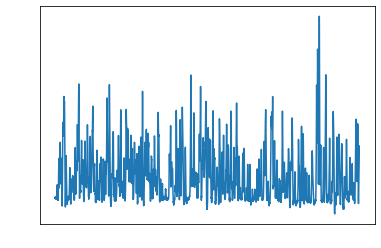

In [424]:
data = cable_data[-1][3]
data = data[:7200]
plt.plot(data)

In [459]:
def preprocess(data):
    peaks_, _ = find_peaks(data, height=(np.mean(data) - np.std(data), np.mean(data) + np.std(data)))
    peak_data = np.empty(len(data))
    peak_data[:] = np.nan
    np.put(peak_data, peaks, data[peaks])
    idx = np.argwhere(~np.isnan(peak_data))[0][0]
    peak_data[0] = peak_data[idx]
    
    peak = data[peaks]
    median_peak = median_filter(peak, 50)
    median_peak_data = np.empty(len(data))
    median_peak_data[:] = np.nan
    np.put(median_peak_data, peaks, median_peak)
    
    return peak_data, median_peak_data

In [460]:
peak, median_peak = preprocess(data)

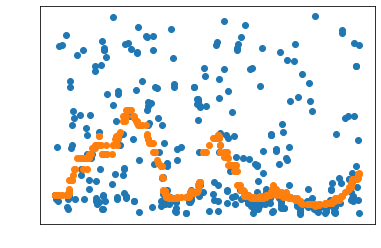

In [461]:
plt.scatter(np.arange(len(data)), peak)
plt.scatter(np.arange(len(data)), median_peak)

In [462]:
median_peak

array([nan, nan, nan, ..., nan, nan, nan])

In [392]:
np.std(data), np.mean(data)

(20.737424349045966, 2031.1083801629113)

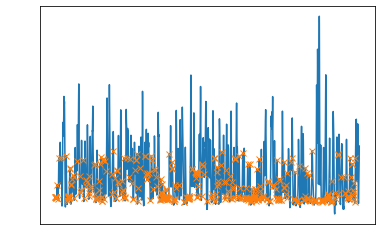

In [393]:
peaks, _ = find_peaks(data, height=(np.mean(data) - np.std(data), np.mean(data) + np.std(data)))
plt.plot(data)
plt.plot(peaks, data[peaks], "x")
#plt.plot(np.zeros_like(data), "--", color="gray")

In [394]:
peaks

array([   5,   13,   16,   20,   23,   25,   30,   37,   54,   70,   92,
        154,  264,  285,  298,  304,  312,  318,  321,  325,  327,  333,
        354,  358,  387,  392,  404,  419,  441,  459,  512,  593,  603,
        606,  662,  686,  734,  744,  751,  797,  806,  816,  853,  857,
        933,  937,  955,  964,  971,  977, 1022, 1036, 1044, 1070, 1092,
       1110, 1112, 1117, 1125, 1141, 1145, 1147, 1170, 1188, 1209, 1339,
       1352, 1368, 1401, 1423, 1439, 1446, 1471, 1478, 1485, 1524, 1580,
       1592, 1607, 1609, 1617, 1638, 1663, 1665, 1711, 1749, 1770, 1816,
       1852, 1857, 1896, 1911, 1914, 1941, 1958, 1969, 2023, 2136, 2140,
       2148, 2176, 2180, 2185, 2187, 2235, 2257, 2281, 2290, 2311, 2332,
       2379, 2402, 2421, 2477, 2485, 2500, 2511, 2517, 2524, 2528, 2542,
       2557, 2564, 2569, 2572, 2576, 2584, 2591, 2597, 2602, 2605, 2617,
       2620, 2629, 2637, 2646, 2650, 2656, 2659, 2663, 2670, 2674, 2676,
       2679, 2684, 2708, 2759, 2777, 2780, 2805, 28

In [401]:
new_data = np.empty(len(data))
new_data[:] = np.nan
ins = np.insert(new_data, peaks, data[peaks])
new_data.shape

(7200,)

In [408]:
ins = np.insert(new_data, peaks, data[peaks])
ins[:20]

array([          nan,           nan,           nan,           nan,
                 nan, 2014.42566396,           nan,           nan,
                 nan,           nan,           nan,           nan,
                 nan,           nan, 2014.4227875 ,           nan,
                 nan,           nan, 2013.9287375 ,           nan])

In [410]:
np.argwhere(~np.isnan(ins))[0][0]

5

In [361]:
new_data = []
for i in range(len(data)):
    if i in peaks:
        new_data.append(data[i])
    else:
        new_data.append(np.nan)

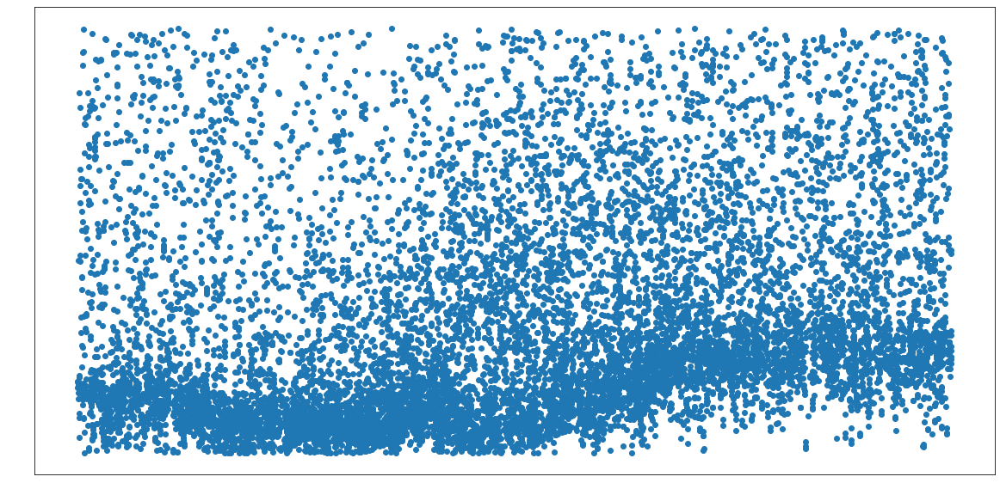

In [362]:
plt.figure(figsize=(20,10))
plt.scatter(np.arange(len(new_data)), new_data)

In [412]:
peak = data[peaks]
peak.shape

(383,)

In [413]:
peak = data[peaks]
median_peak = median_filter(peak, 50)
median_peak.shape

(383,)

In [416]:
median_peak_data = np.empty(len(data))
median_peak_data[:] = np.nan
median_peak_data = np.insert(median_peak_data, peaks, median_peak)

In [421]:
ins.isna()

AttributeError: 'numpy.ndarray' object has no attribute 'isna'

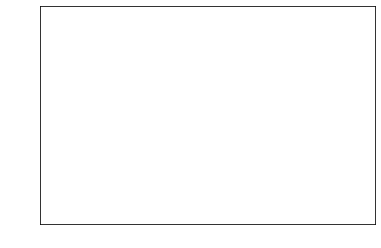

In [419]:
plt.plot(ins)

In [365]:
from scipy.ndimage import median_filter
med_peak = median_filter(peak, 50)
med_peak.shape

(12568,)

In [366]:
new_data_mean = []
idx = 0
for i in range(len(data)):
    if i in peaks:
        new_data_mean.append(med_peak[idx])
        idx += 1
    else:
        new_data_mean.append(np.nan)

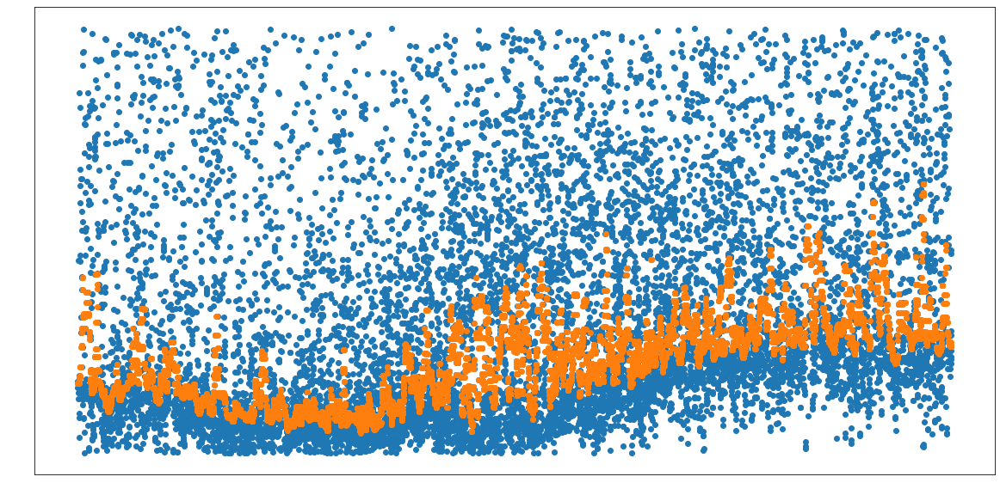

In [367]:
plt.figure(figsize=(20,10))
plt.scatter(np.arange(len(new_data)), new_data)
plt.scatter(np.arange(len(new_data_mean)), new_data_mean)

In [379]:
for i in range(len(new_data_mean)):
    if not np.isnan(new_data_mean[i]):
        print(i, 'nan')
        break
new_data_mean[i]

5 nan


2014.31735

In [380]:
new_data_mean[0] = new_data_mean[i]

In [381]:
new_data = np.array(new_data)
new_data_mean = np.array(new_data_mean)

In [382]:
new_data_mean[:20]

array([2014.31735,        nan,        nan,        nan,        nan,
       2014.31735,        nan,        nan,        nan,        nan,
              nan,        nan,        nan, 2014.31735,        nan,
              nan, 2014.31735,        nan,        nan,        nan])

In [383]:
x_inter = pd.Series(new_data_mean).interpolate()
x_inter.head(20)

0     2014.31735
1     2014.31735
2     2014.31735
3     2014.31735
4     2014.31735
5     2014.31735
6     2014.31735
7     2014.31735
8     2014.31735
9     2014.31735
10    2014.31735
11    2014.31735
12    2014.31735
13    2014.31735
14    2014.31735
15    2014.31735
16    2014.31735
17    2014.31735
18    2014.31735
19    2014.31735
dtype: float64

In [384]:
r_df = pd.Series(x_inter).rolling(1200, min_periods=1).mean()
r_df

0         2014.317350
1         2014.317350
2         2014.317350
3         2014.317350
4         2014.317350
             ...     
172615    2019.669651
172616    2019.666174
172617    2019.662697
172618    2019.659220
172619    2019.655744
Length: 172620, dtype: float64

In [385]:
COLOR = 'white'
plt.rcParams['text.color'] = COLOR
plt.rcParams['axes.labelcolor'] = COLOR
plt.rcParams['xtick.color'] = COLOR
plt.rcParams['ytick.color'] = COLOR

C:\Users\vfgtr\anaconda3\envs\learning\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


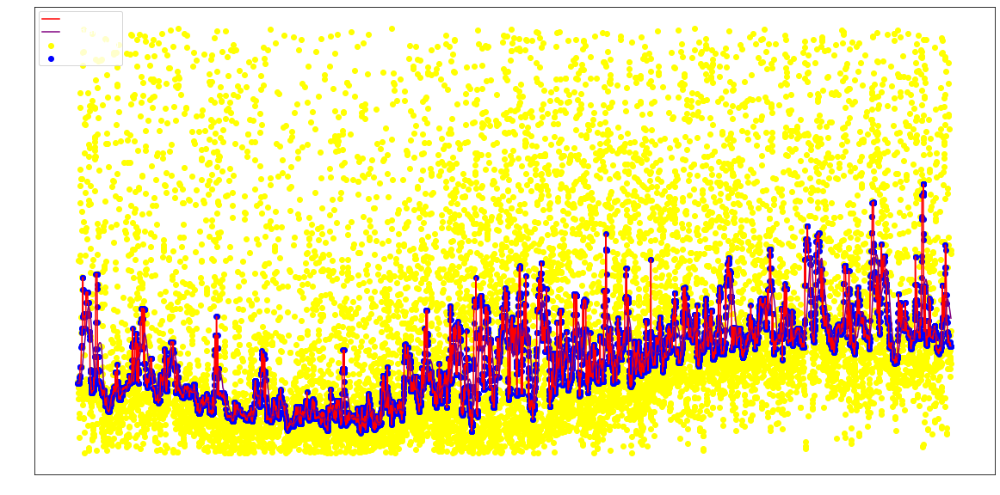

In [386]:
plt.figure(figsize=(20,10))
plt.scatter(np.arange(len(new_data)), new_data, color='yellow')
plt.scatter(np.arange(len(new_data_mean)), new_data_mean, color='blue')
plt.plot(x_inter, color='red')
plt.plot(r_df, color='purple')
plt.legend(['peak', 'median', 'interpolated', 'effect'])

In [350]:
paper_data = data - r_df

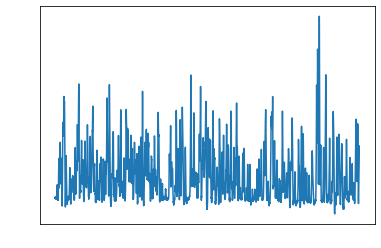

In [348]:
plt.plot(data)

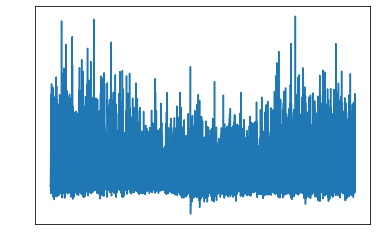

In [387]:
plt.plot(data - r_df)

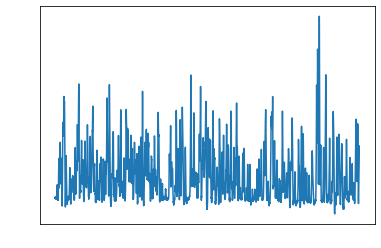

In [352]:
plt.plot(data)

In [388]:
r_df = pd.Series(data).rolling(1200, min_periods=1).mean()

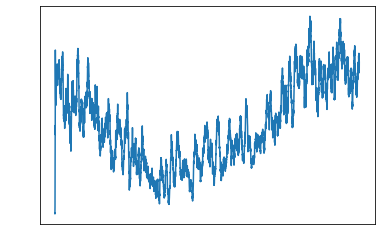

In [389]:
plt.plot(r_df)

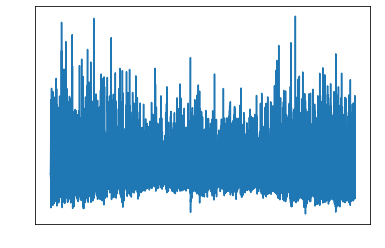

In [390]:
plt.plot(data - r_df)

In [286]:
peak = data[peaks]
peak.shape

(383,)

In [287]:
from scipy.ndimage import median_filter
med_peak = median_filter(peak, 50)
med_peak.shape

(383,)

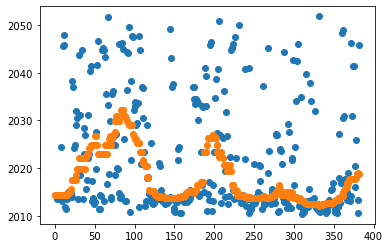

In [278]:
plt.scatter(np.arange(len(peak)), peak)
plt.scatter(np.arange(len(med_peak)), med_peak)

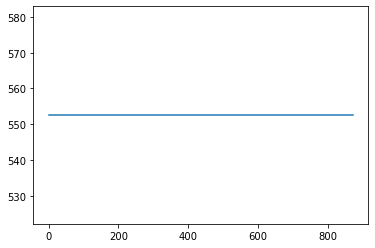

In [269]:
move_peak = moving_average(peak, 1200)
plt.plot(move_peak)

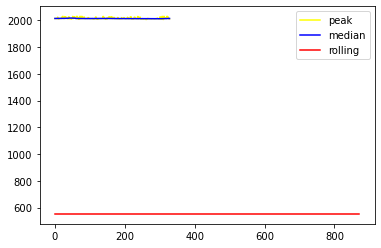

In [270]:
plt.plot(peak, color='yellow')
plt.plot(med_peak, color='blue')
plt.plot(move_peak, color='red')
plt.legend(['peak', 'median', 'rolling'])

In [213]:
plt.plot(data - peak)

ValueError: operands could not be broadcast together with shapes (172620,) (13908,) 

In [195]:
np.std(data), np.mean(data)

(17.44216316024581, 2026.032646203544)

In [191]:
from scipy import signal
data = cable_data[-1][3]
peak = signal.find_peaks(data)

In [193]:
peak

(array([     5,     13,     16, ..., 172569, 172575, 172610], dtype=int64), {})

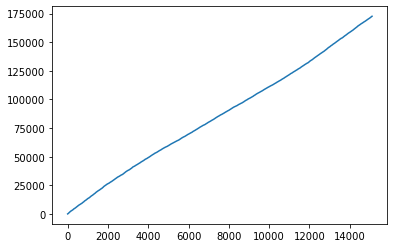

In [194]:
plt.plot(peak[0])

In [176]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
none_detrend_cable_data = datas

In [178]:
datas = none_detrend_cable_data.copy()
none_detrend_new_list = []
for i, data in enumerate(datas):
    none_detrend_new_list.append([])
    for j, d in enumerate(data):
        d = moving_average(d, 7200)
        none_detrend_new_list[i].append(d)
none_detrend_new_list = np.array(none_detrend_new_list)
none_detrend_new_list.shape

(10, 14, 165421)

In [179]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    data = detrend(data)
    datas[i] = data
detrend_cable_data = datas

In [180]:
datas = detrend_cable_data.copy()
detrend_new_list = []
for i, data in enumerate(datas):
    detrend_new_list.append([])
    for j, d in enumerate(data):
        d = moving_average(d, 7200)
        detrend_new_list[i].append(d)
detrend_new_list = np.array(detrend_new_list)
detrend_new_list.shape

(10, 14, 165421)

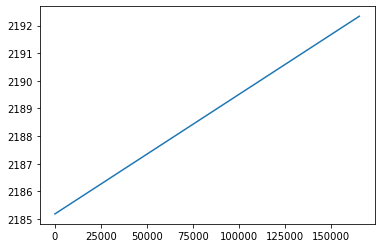

In [185]:
diff = np.array(none_detrend_new_list) - np.array(detrend_new_list)
plt.plot(diff[0][0])

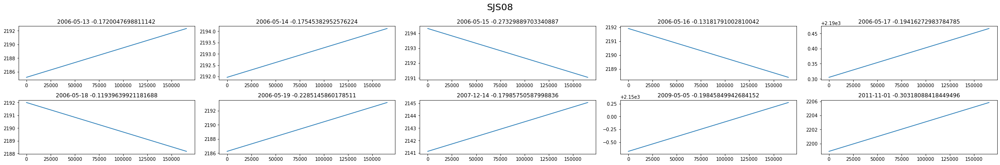

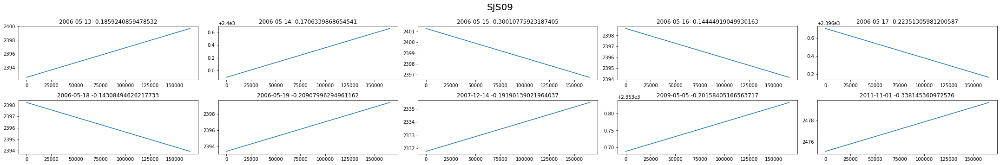

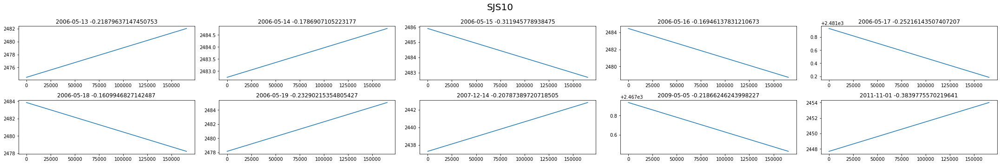

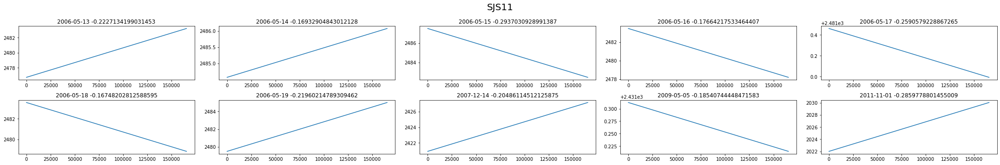

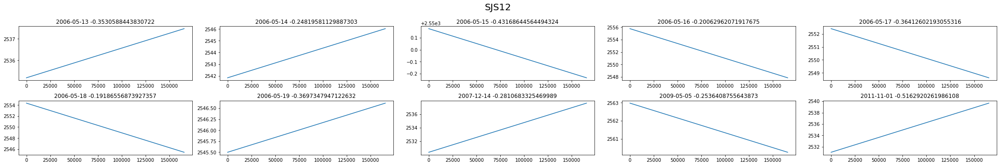

...

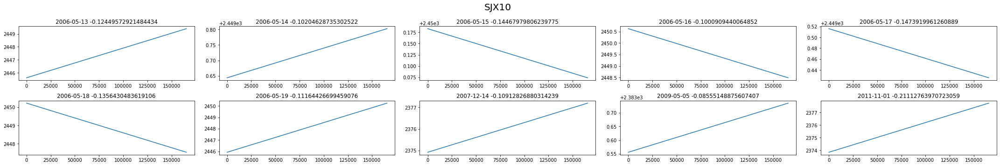

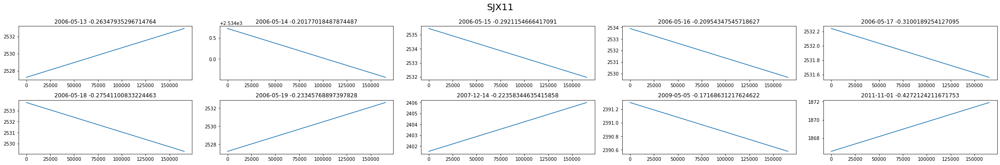

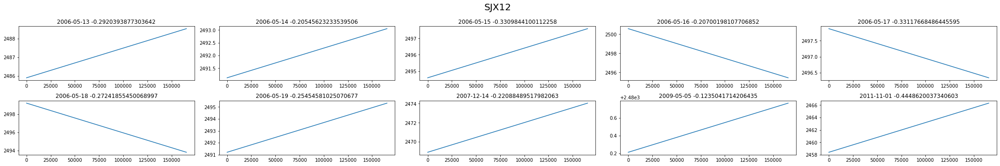

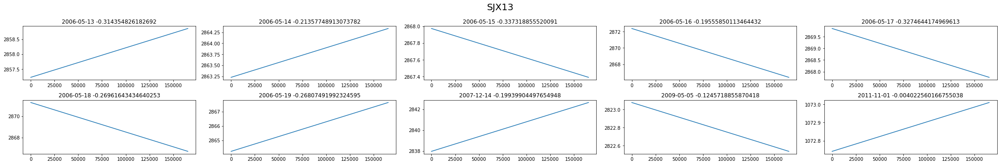

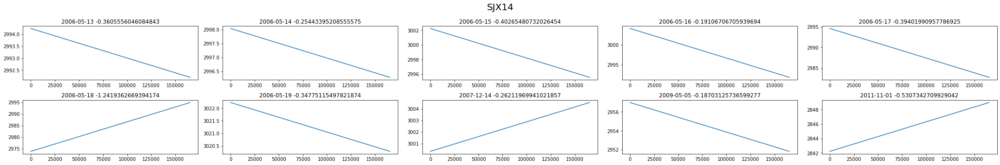

In [186]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(new_list[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(none_detrend_new_list[idx][i] - detrend_new_list[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

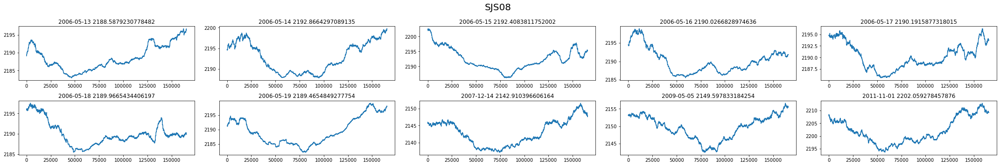

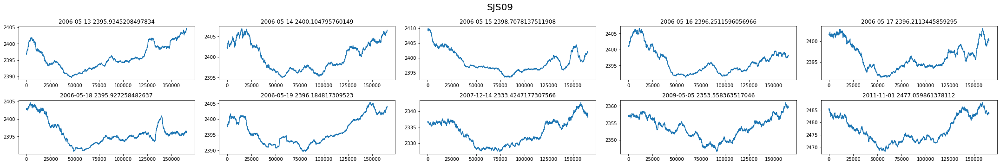

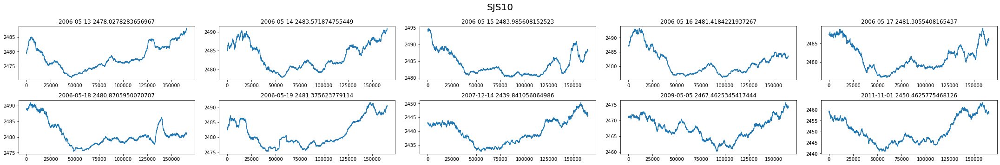

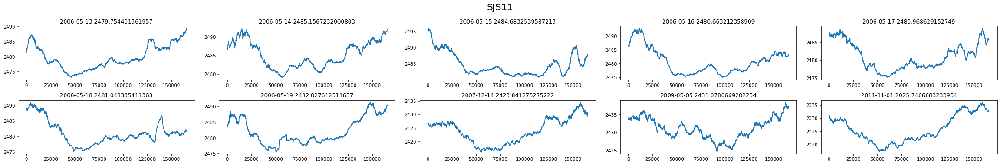

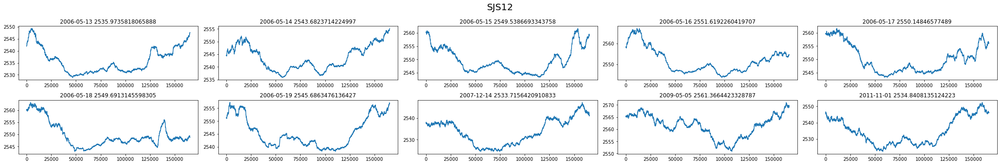

...

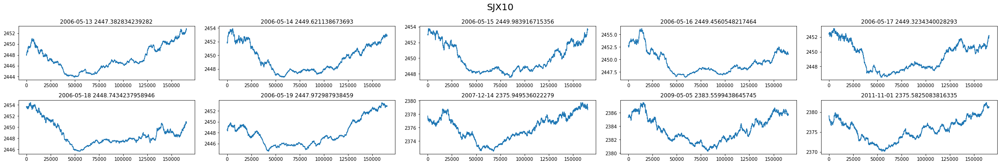

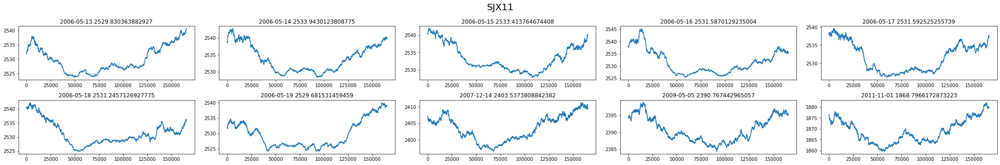

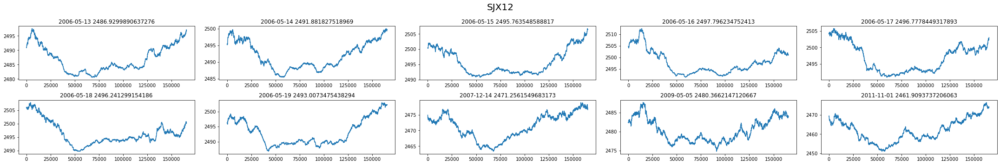

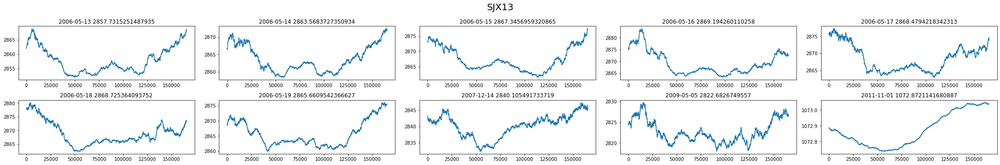

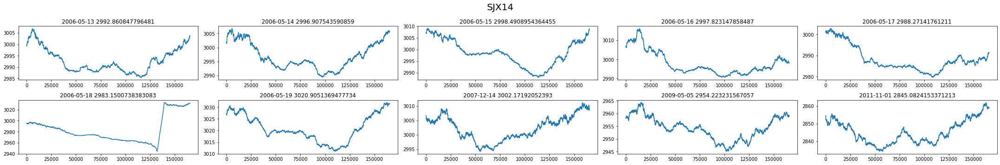

In [163]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(new_list[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i] - new_list[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

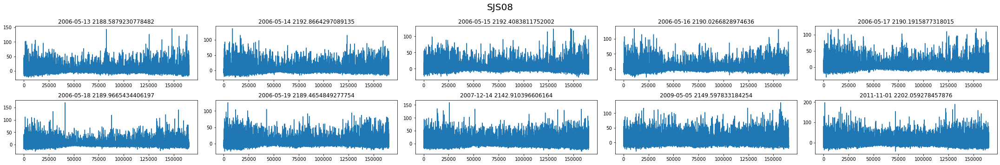

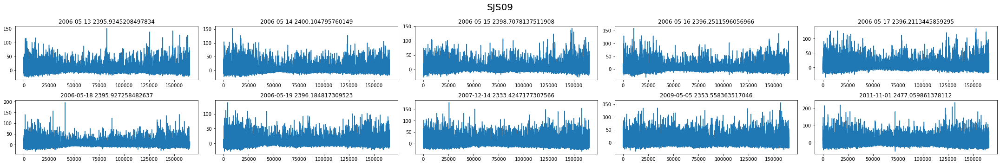

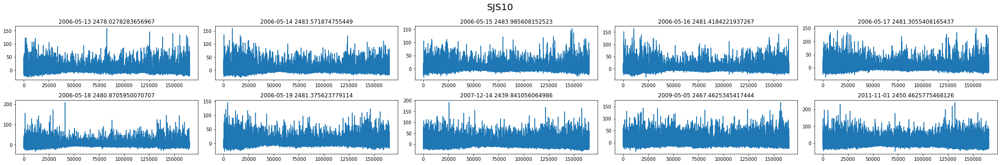

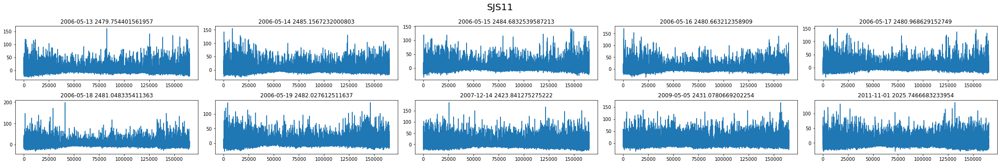

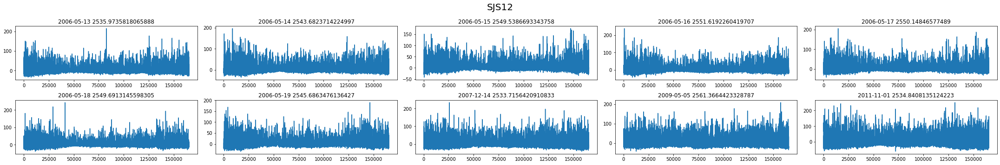

...

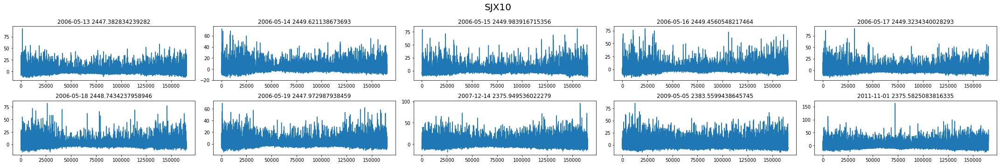

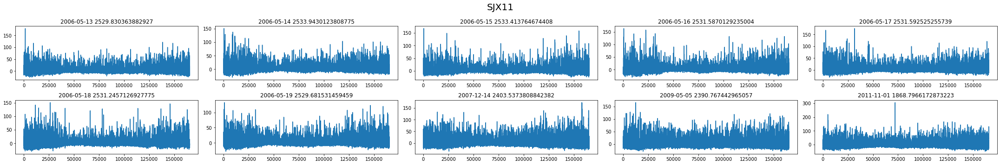

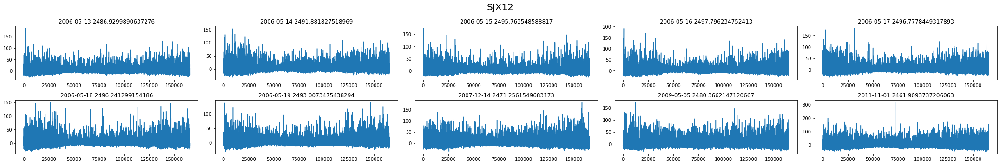

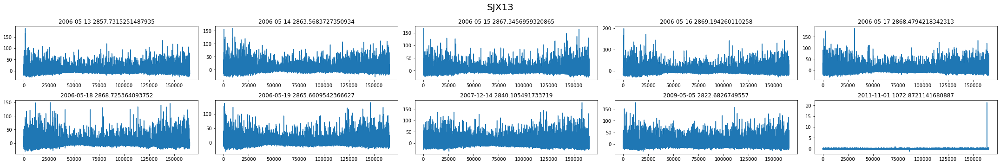

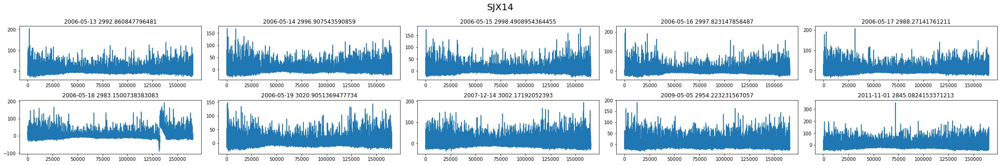

In [165]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(new_list[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i][7199:] - new_list[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [166]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    data = detrend(data)
    datas[i] = data
cable_data = datas

In [167]:
np.array(cable_data).shape

(10, 14, 172620)

In [168]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [169]:
datas = cable_data.copy()
new_list = []
for i, data in enumerate(datas):
    new_list.append([])
    for j, d in enumerate(data):
        d = moving_average(d, 7200)
        new_list[i].append(d)
new_list = np.array(new_list)
new_list.shape

(10, 14, 165421)

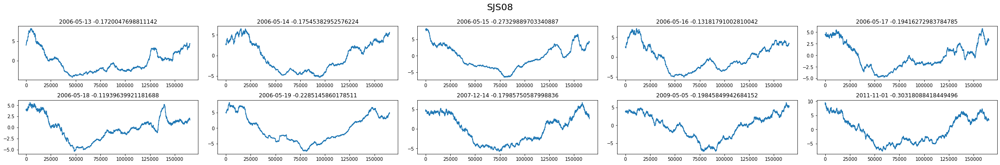

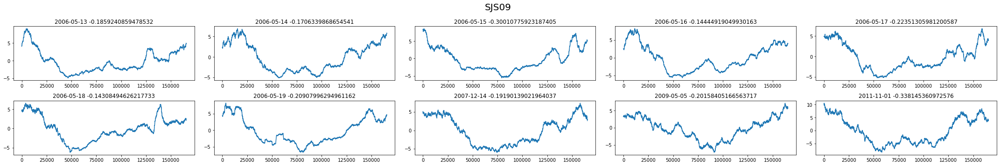

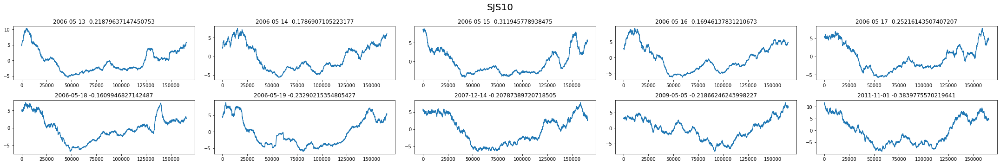

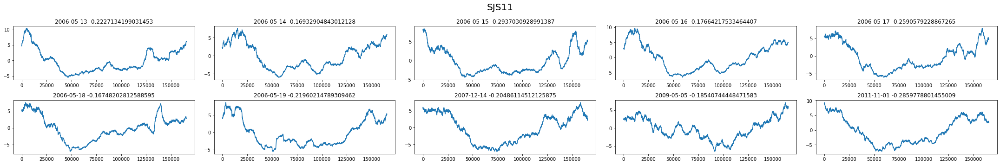

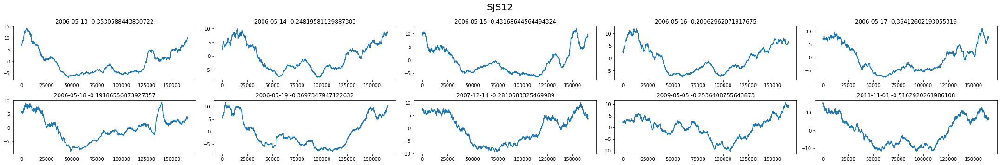

...

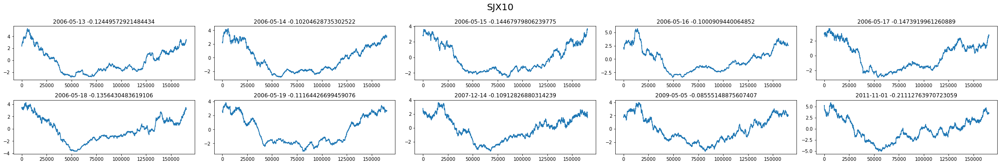

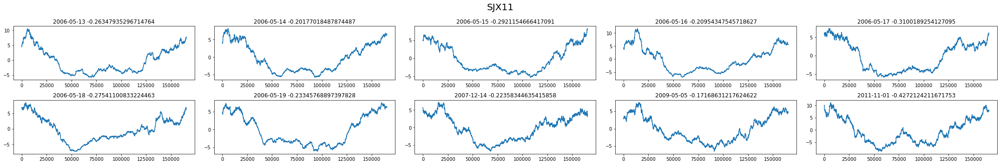

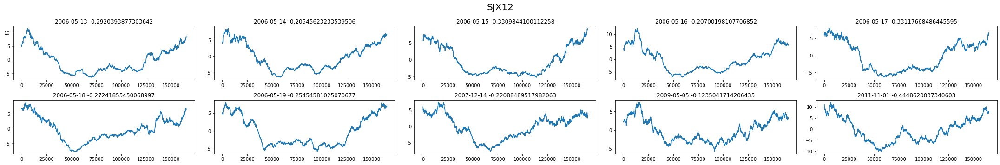

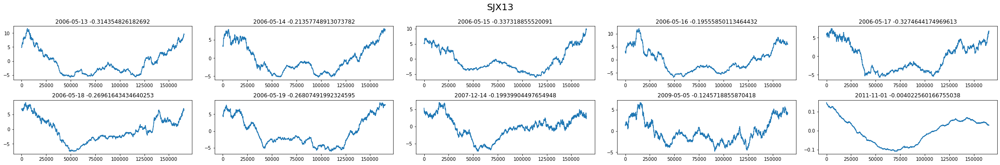

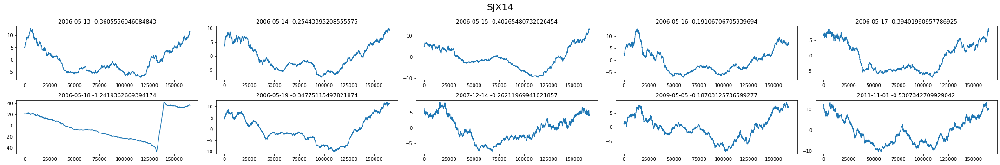

In [156]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(new_list[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(new_list[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

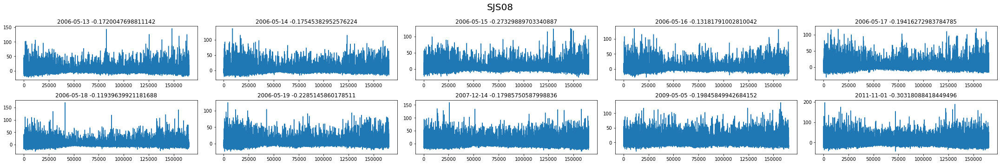

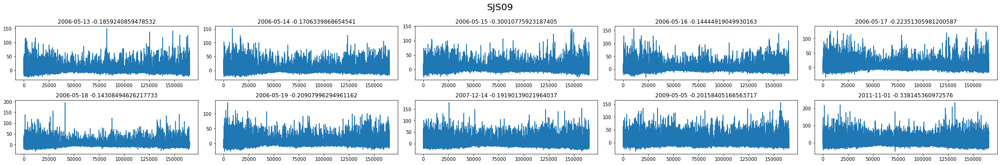

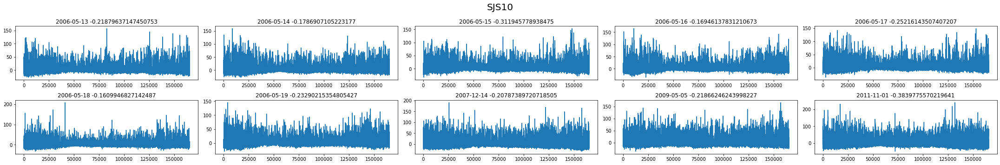

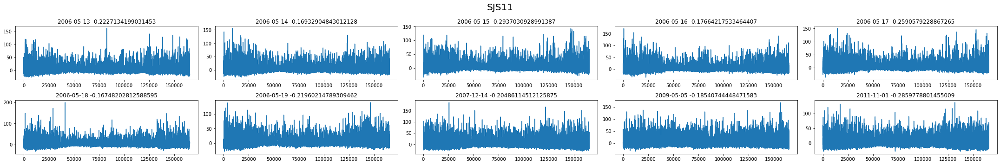

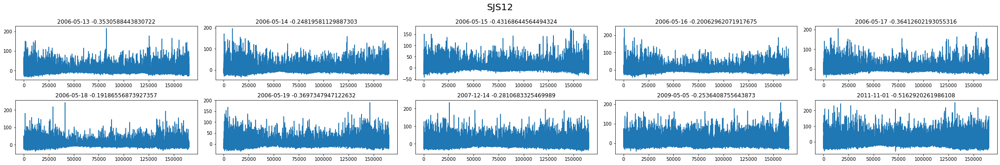

...

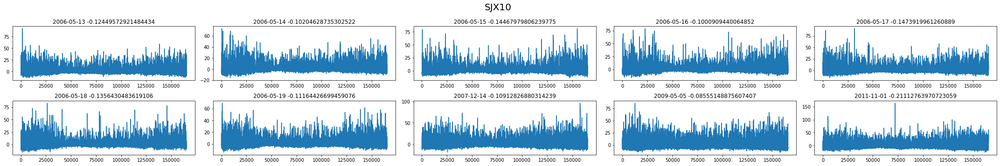

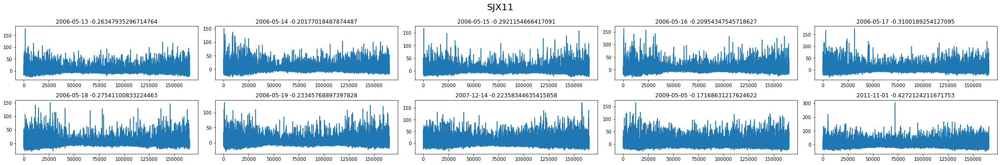

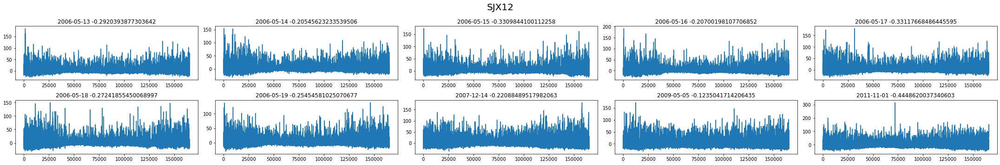

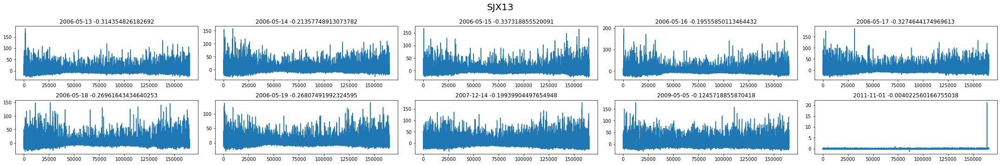

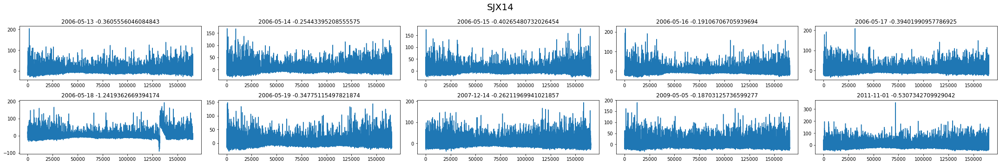

In [171]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(new_list[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i][7199:] - new_list[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

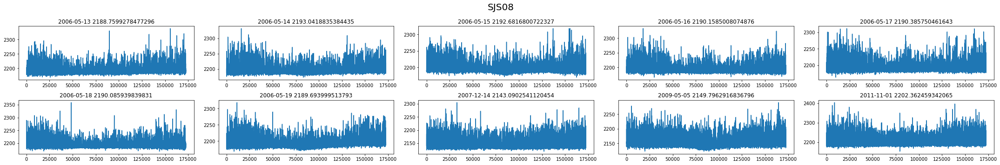

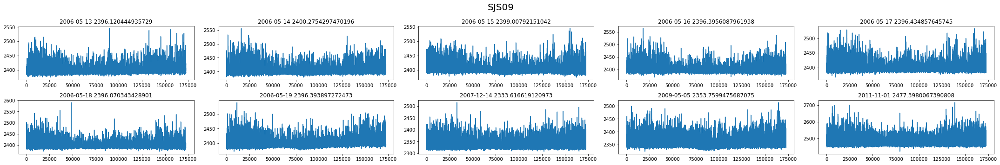

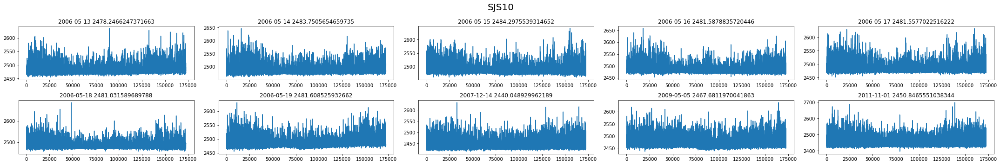

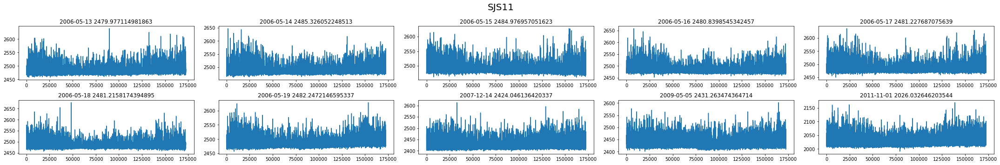

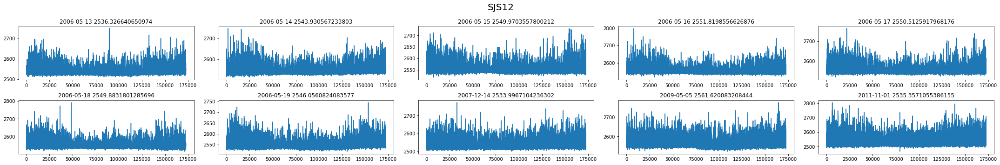

...

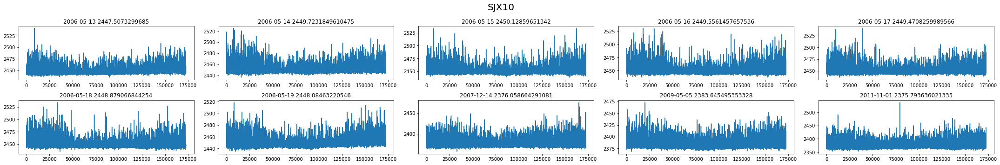

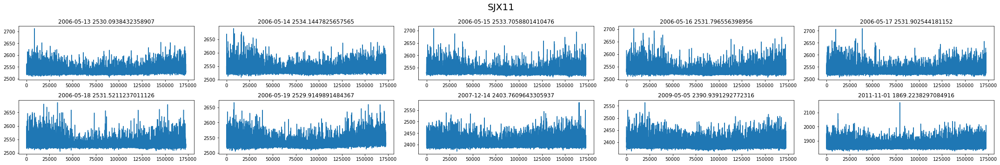

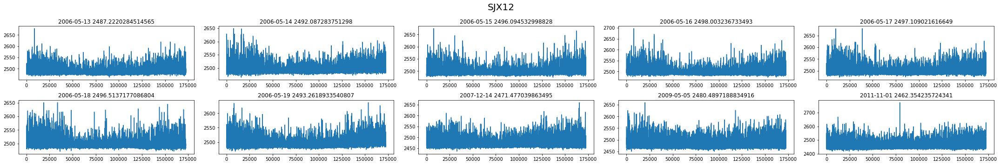

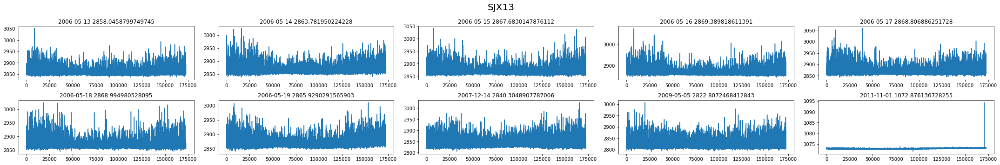

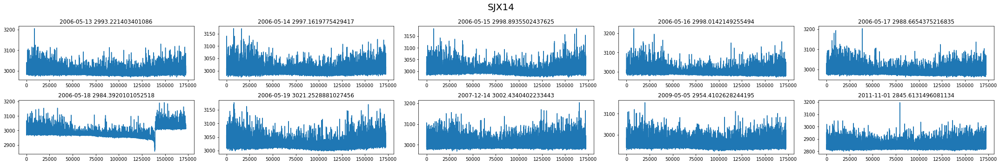

In [133]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_data[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [19]:
from scipy import signal
from scipy.signal import butter, filtfilt

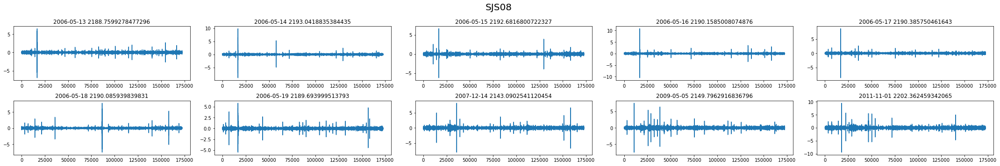

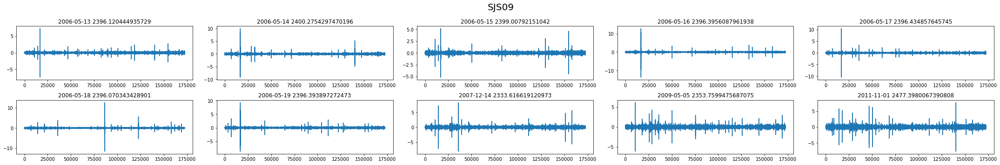

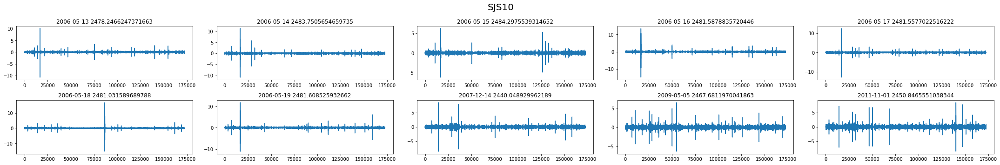

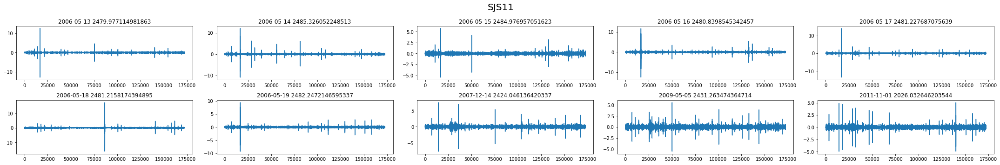

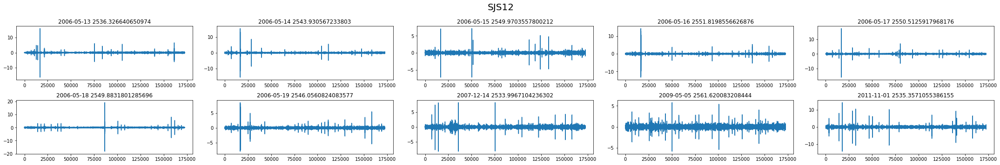

...

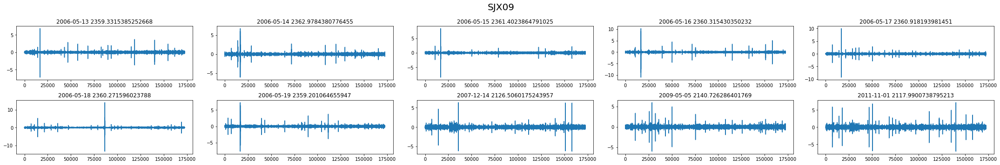

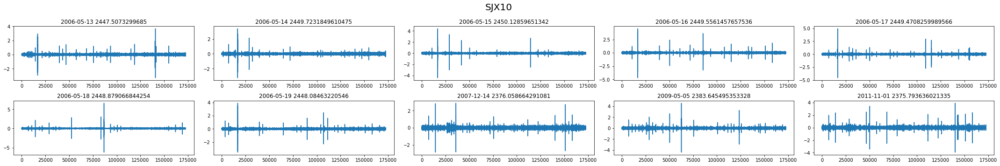

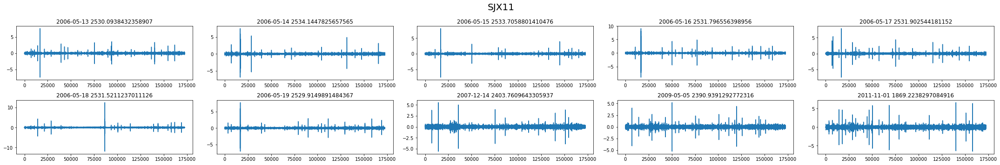

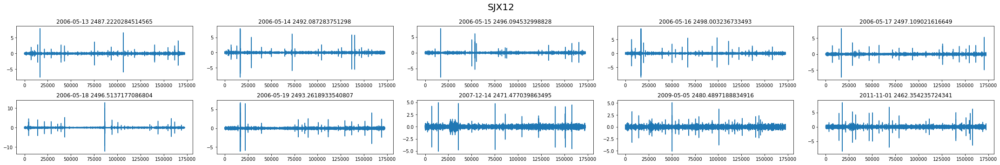

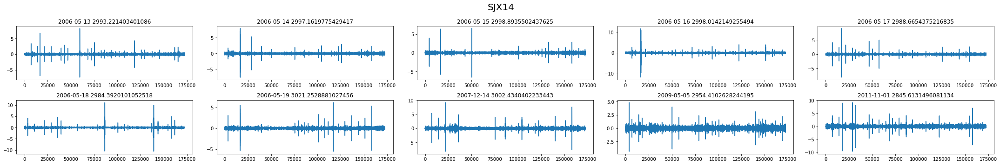

In [24]:
for i in range(12):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            b, a = butter(2, 0.8, btype='low', analog=False)
            x = filtfilt(b, a, cable_data[idx][i])
            title = file_names[idx] + ' ' + str(np.mean(cable_data[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i] - x)
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [73]:
cable_data = np.array(cable_data)
cable_data = np.log(cable_data)

In [140]:
from scipy.signal import detrend

In [ ]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_data[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(detrend(cable_data[idx][i]))
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

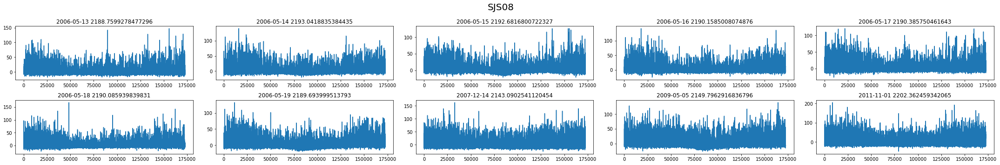

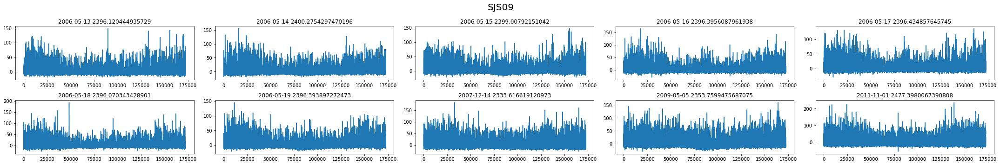

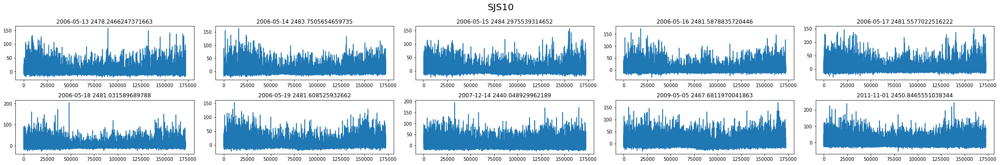

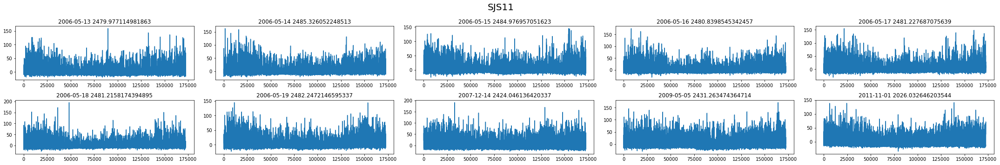

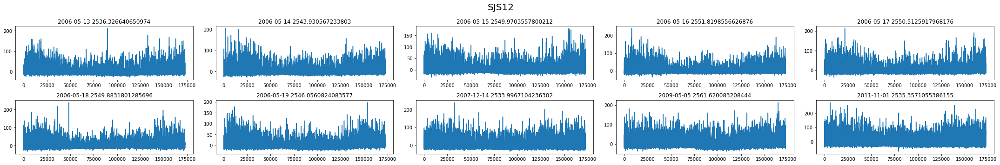

...

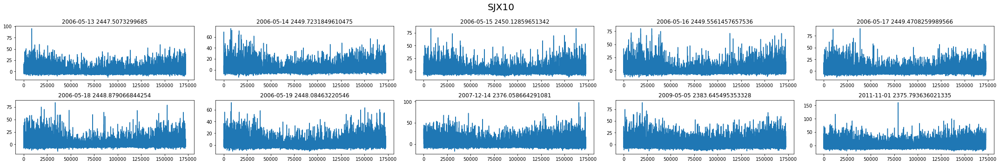

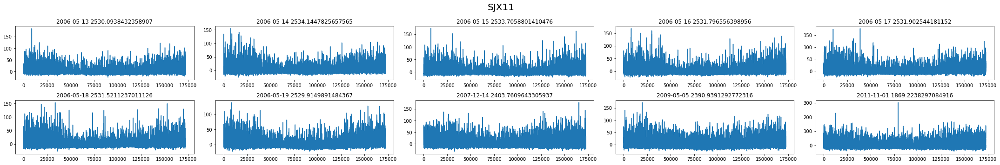

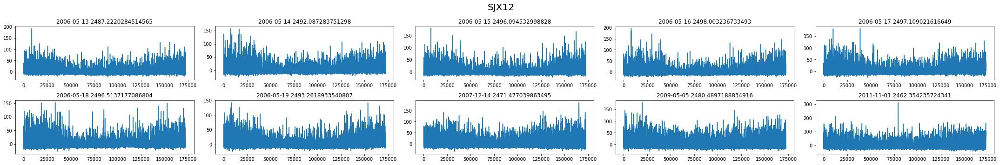

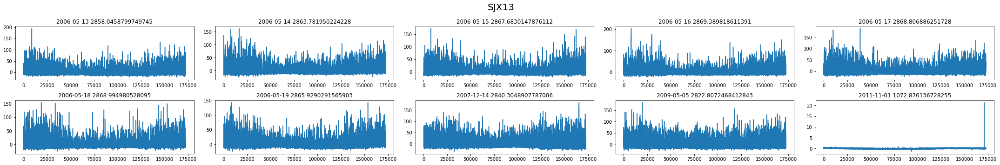

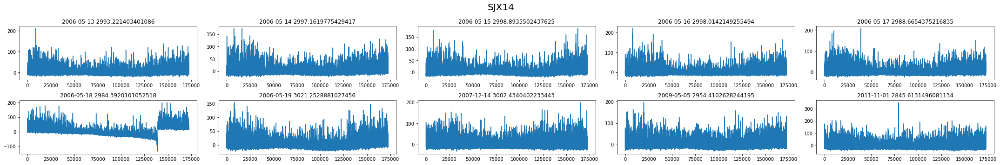

In [142]:
for i in range(14):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_data[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(detrend(cable_data[idx][i]))
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()

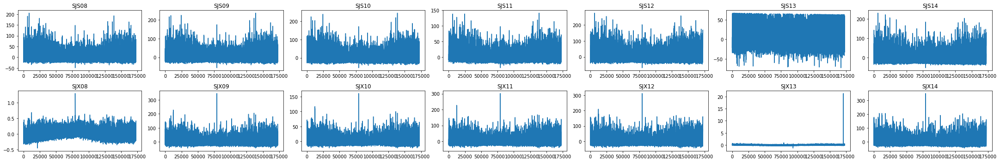

In [143]:
fig, ax = plt.subplots(2, 7, figsize=(30,5))
num = 0
for j in range(2):
    for k in range(7):
        idx = num
        num += 1
        
        title = cable_title[idx]
        ax[j][k].set_title(title)
        ax[j][k].plot(detrend(cable_data[-1][idx]))
#plt.suptitle(file_names[i], fontsize=20)
plt.tight_layout()
plt.show()

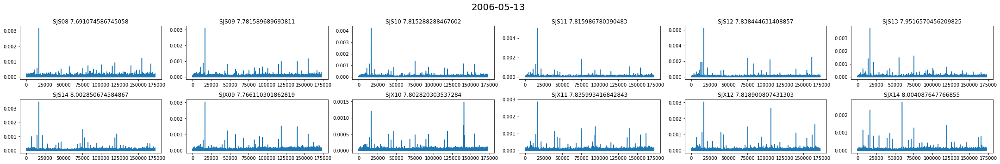

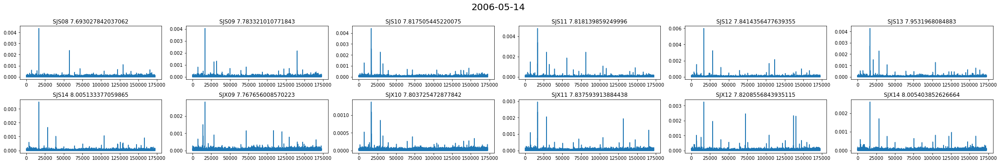

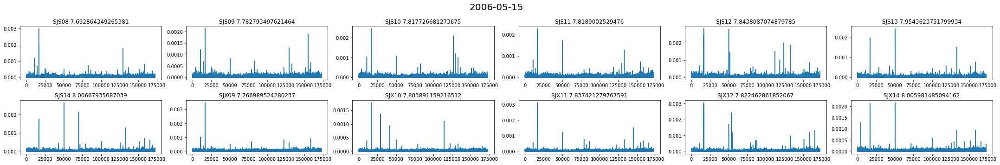

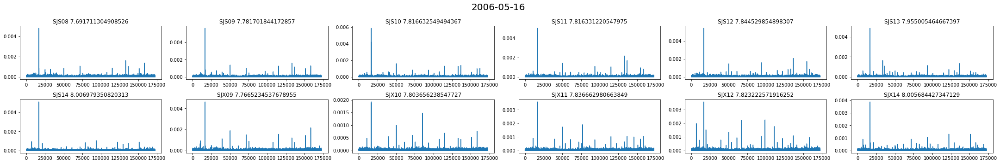

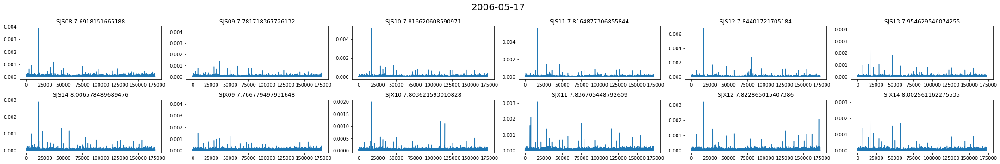

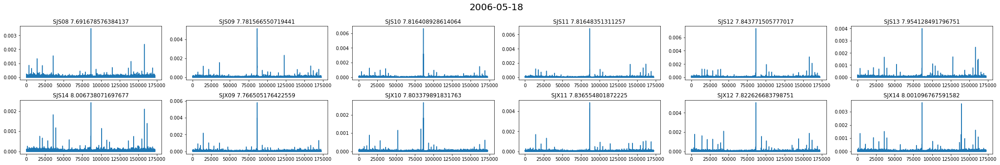

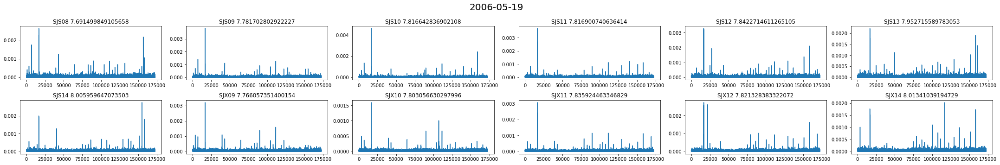

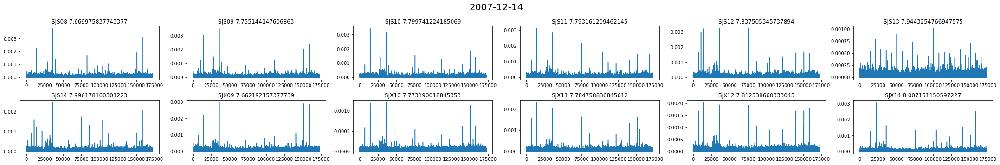

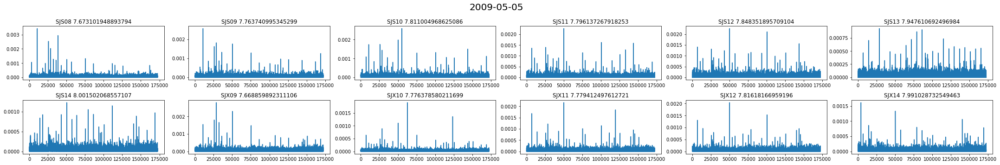

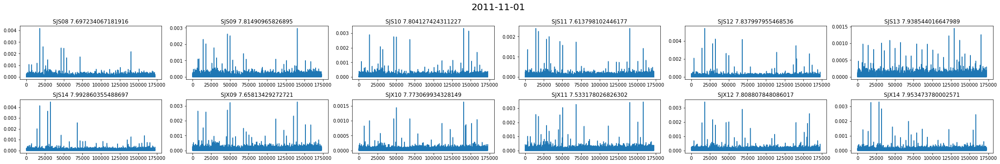

In [84]:
lpfs = []
#cnt = 0
for i in range(10):
    lpfs.append([])
    fig, ax = plt.subplots(2, 6, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(6):
            idx = num
            num += 1
            
            b, a = butter(2, 0.8, btype='low', analog=False)
            x = filtfilt(b, a, cable_data[i][idx])
            title = cable_title[idx] + ' ' + str(np.mean(cable_data[i][idx]))
            ax[j][k].set_title(title)
            ax[j][k].plot(np.abs(cable_data[i][idx] - x))
            lpfs[i].append(np.array(cable_data[i][idx]) - np.array(x))
            #cnt += 1
    plt.suptitle(file_names[i], fontsize=20)
    plt.tight_layout()
    plt.show()

In [86]:
lpfs = np.array(lpfs)
lpfs.shape

(10, 12, 172620)

In [88]:
#cable_train = lpfs.reshape((120, 172620))
cable_train = lpfs.reshape((120, 172620))

In [90]:
from tslearn.clustering import TimeSeriesKMeans

km = TimeSeriesKMeans(n_clusters=10, verbose=True, random_state=0)
y_pred = km.fit_predict(cable_train)

y_pred = y_pred.reshape(10, 12)
print(y_pred)

0.000 --> 0.000 --> 0.000 --> 0.000 --> 
[[7 2 2 2 2 2 2 2 7 2 2 2]
 [7 7 9 9 9 9 9 7 7 9 9 9]
 [7 7 7 7 7 7 7 7 7 7 7 7]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [8 8 8 8 8 8 8 8 8 8 8 8]
 [3 3 3 3 3 3 3 3 3 3 3 3]
 [7 7 7 7 7 7 7 7 7 7 7 7]
 [4 4 4 4 4 7 7 4 7 4 4 7]
 [6 6 6 6 6 7 7 6 7 6 6 7]
 [1 1 5 5 5 7 5 1 7 5 5 5]]


In [94]:
y_pred = y_pred.reshape(120)
uniqe = np.unique(y_pred)
cnts = [np.sum(y_pred==i) for i in range(10)]
cnts

[12, 3, 10, 12, 8, 7, 8, 40, 12, 8]

In [95]:
cable_train_dtw = cable_train[:,::100]
cable_train_dtw.shape

(120, 1727)

In [97]:
dtw_km = TimeSeriesKMeans(n_clusters=10, n_init=2, metric="dtw", verbose=True, max_iter_barycenter=10, random_state=0)
y_pred = dtw_km.fit_predict(cable_train_dtw)
y_pred = y_pred.reshape(120, y_pred.shape[1])
print(y_pred)

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   14.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   15.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   15.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

0.000 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1200 out of 1200 | elapsed:   36.1s finished


0.000 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   13.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   13.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:   13.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

0.000 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1200 out of 1200 | elapsed:   33.0s finished


0.000 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 1200 out of 1200 | elapsed:   34.7s finished


IndexError: tuple index out of range

In [120]:
y_pred = y_pred.reshape(10, 12)
print(y_pred)

[[0 7 7 7 7 7 7 1 0 7 7 7]
 [5 5 5 5 5 7 7 5 0 5 5 0]
 [7 3 3 3 3 7 7 3 3 3 3 7]
 [6 6 0 0 7 7 7 6 0 0 7 3]
 [0 0 0 0 6 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 7 0 0 0 0 7]
 [7 7 7 1 1 0 0 7 0 7 1 0]
 [2 2 2 2 1 0 0 2 0 1 1 0]
 [5 1 1 1 1 0 0 5 0 0 1 0]
 [8 8 8 1 4 0 4 8 0 9 4 4]]


In [121]:
y_pred = y_pred.reshape(120)
uniqe = np.unique(y_pred)
cnts = [np.sum(y_pred==i) for i in range(10)]
cnts

[44, 13, 5, 9, 4, 10, 4, 26, 4, 1]

In [98]:
data = cable_data[0][0]

In [118]:
b, a = butter(100, 0.8, btype='low', analog=False)
x = filtfilt(b, a, data)

In [112]:
b = signal.firwin(101, cutoff=300, fs=1000, pass_zero='lowpass')
x2x = signal.lfilter(b, [1000], data)

In [119]:
len(data), len(x), len(x2x)

(172620, 172620, 172620)

In [122]:
cable_data[-1].shape

(12, 172620)

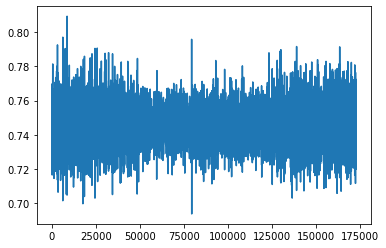

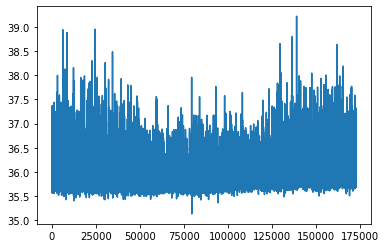

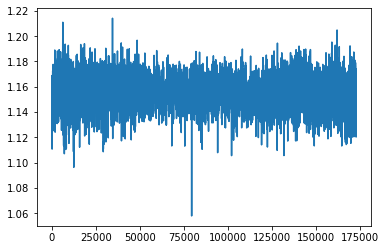

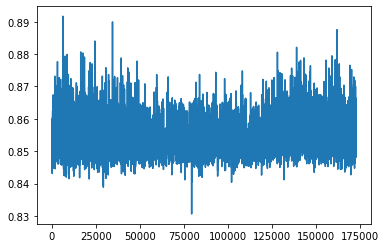

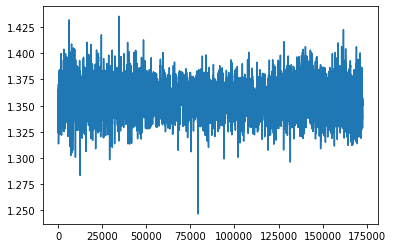

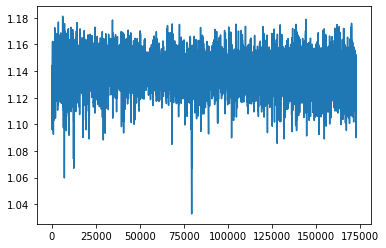

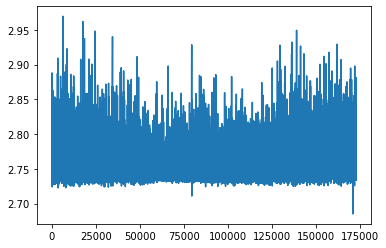

In [130]:
for i in range(7):
    ratio = cable_data[-1][i] / cable_data[-1][i+6]
    plt.plot(ratio)
    plt.show()

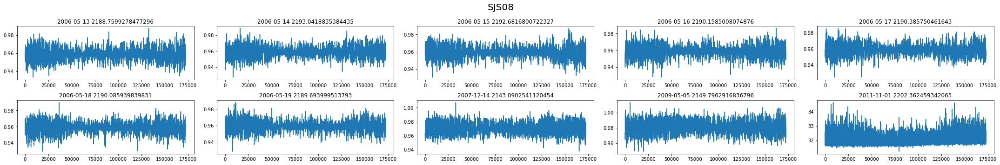

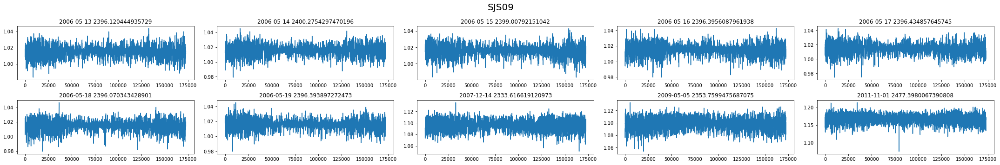

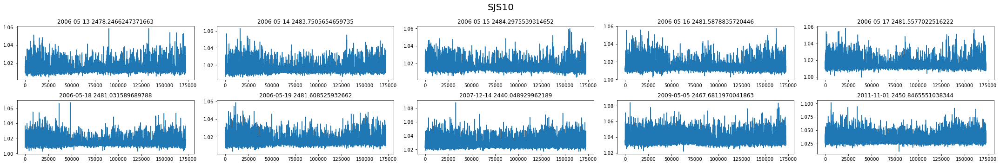

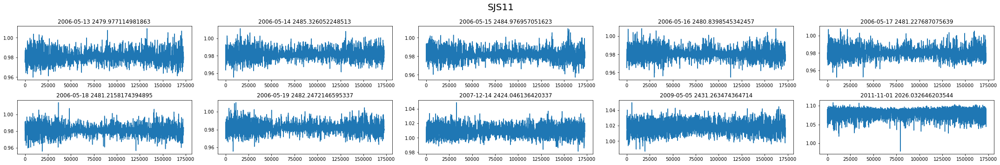

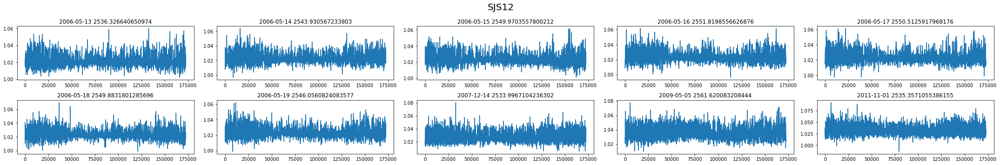

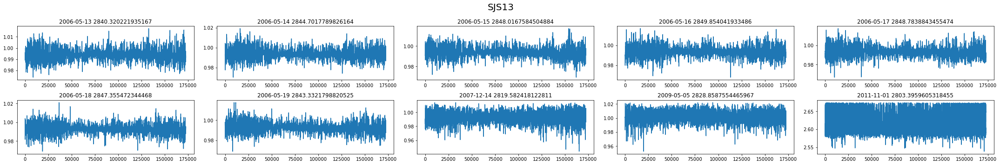

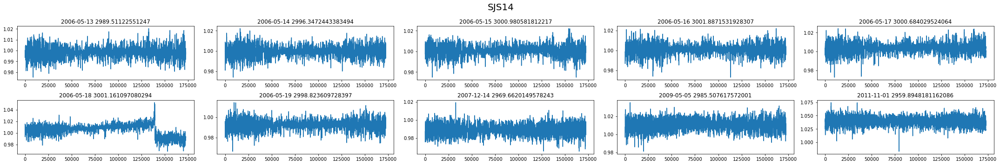

In [136]:
for i in range(7):
    fig, ax = plt.subplots(2, 5, figsize=(30,5))
    num = 0
    for j in range(2):
        for k in range(5):
            idx = num
            num += 1
            
            title = file_names[idx] + ' ' + str(np.mean(cable_data[idx][i]))
            ax[j][k].set_title(title)
            ax[j][k].plot(cable_data[idx][i] / cable_data[idx][i+7])
    plt.suptitle(cable_title[i], fontsize=20)
    plt.tight_layout()
    plt.show()